## Pix2Pix CGAN on Cityscapes Pix2Pix dataset

In this notebook we implement a CGAN architectue for translating segmented images to real images from cityscapes dataset

GANs (Generative Adversarial Networks) are famous models for generating images. there is a **generator** to generate images and a **discriminator** to recognize if the image is real or generated by generator.
in the input of Generator we get a random vector z and generate new data and discriminator should return 1 if sample is real and 0 if the sample generated by G 
$$\mathcal{L}_{GAN} = \mathbb{E}_y[\log D(y)] + \mathbb{E}_z[\log (1-D(G(z)))]$$ 
we should maximize respect to D and want to minimize respect to G

### Conditional GAN
Conditional GAN add input x(image, text, label) to the input and conditioned the output on it :
$$\mathcal{L}_{GAN} = \mathbb{E}_{x,y}[\log D(y)] + \mathbb{E}_{x,z}[\log (1-D(G(z)))]$$
we add L1 norm for regularization and generalization to the model because if we use L2 the pictures become blurred.

In [1]:
import torch
from torch import nn
from torch.optim import Adam
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from torchvision.utils import save_image
import os
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
import cv2
from PIL import Image
from torch.optim.lr_scheduler import ExponentialLR
from tqdm import tqdm, trange
import numpy as np

### Pix2Pix is a framework that uses CGAN to translation of paired-image-to-image
[here](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/) is the official PyTorch code for this model and we inspired from it to implement Pix2Pix in this [paper](https://arxiv.org/pdf/1611.07004)

### Dataset
we use Cityscapes dataset which contains real_images and segmented_images both <br>
in one sample so we should separate them and return them in dataset<br>
we normalize the samples to give as input to the network<br>
like the main paper we use batch_size=1

we have train and val dataset :

In [2]:
# Cityscape dataset : 
class CityscapesDataset(Dataset):
    def __init__(self, root, transformer=None):
        self.root = root
        self.transformer = transformer
        self.file_names = [f for f in os.listdir(root) if f.endswith('.jpg')]

    def __len__(self):
        return len(self.file_names)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root, self.file_names[idx])
        img = Image.open(img_name)

        # Split image in half
        width, height = img.size
        real_img = img.crop((0, 0, width // 2, height))
        segmented_img = img.crop((width // 2, 0, width, height))
        
        if self.transformer:
            real_img = self.transformer(real_img)
            segmented_img = self.transformer(segmented_img)
            
        return real_img, segmented_img

### visualizing some samples
first we visualize some samples as below : 

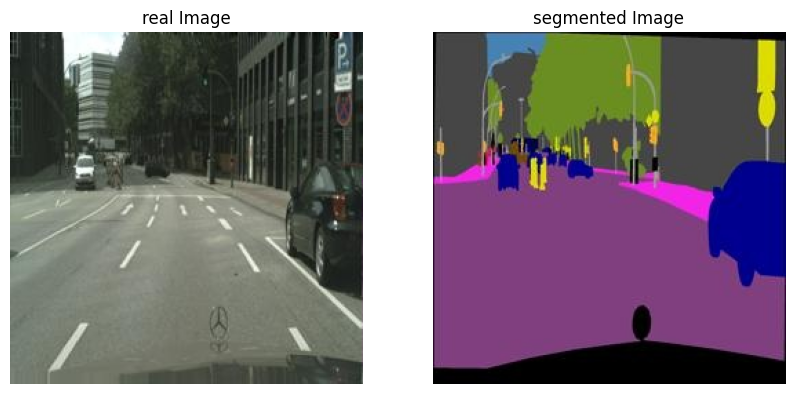

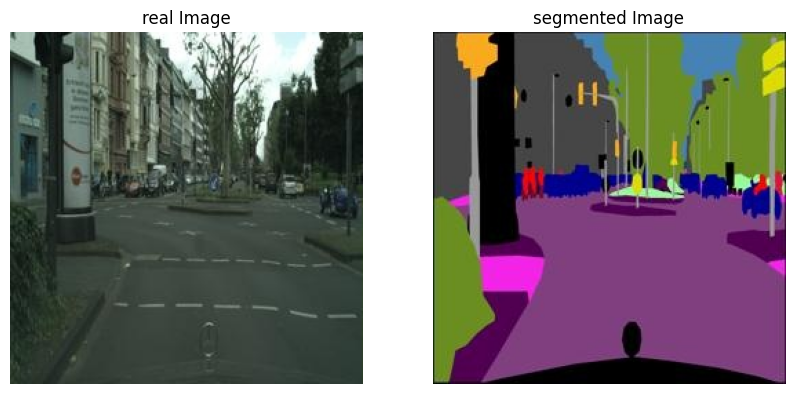

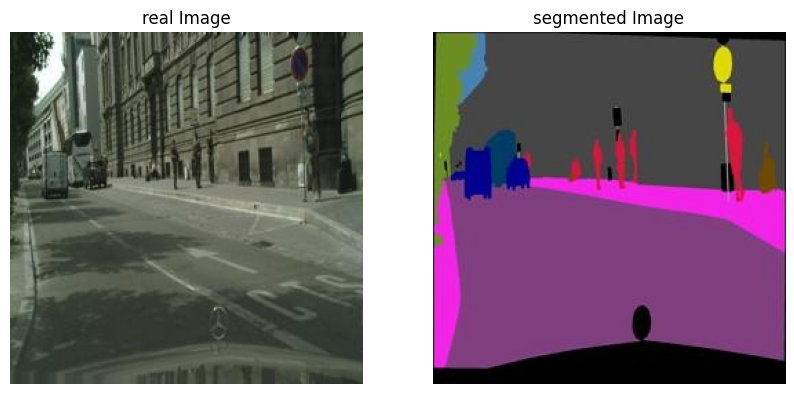

In [3]:
# visualize some samples from dataset : 
def show_images(input_image, target_image):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))
    ax1.imshow(input_image)
    ax1.set_title('real Image')
    ax1.axis('off')
    ax2.imshow(target_image)
    ax2.set_title('segmented Image')
    ax2.axis('off')
    plt.show()

# Path to the dataset folder
dataset_folder = "/kaggle/input/train"
dataset = CityscapesDataset(root=dataset_folder)

# Visualize a few images
for i in range(3):
    input_img, target_img = dataset[i]
    show_images(input_img, target_img)

In [4]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to 256x256
    transforms.ToTensor(),          # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize the tensors
])
root = '/kaggle/input/'
train_dataset = CityscapesDataset(root=root+'train/', transformer=transform)
test_dataset = CityscapesDataset(root=root+'val/', transformer=transform)
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=4)

### Discriminator : 
discriminator consists of a sequence of Conv2d, BatchNorm, LeakyRelu block
it classify data to N x N patches and then recognize for each patch if it is fake or real and the output is data is real or fake 
we use patch GAN architecture :

- input_nc is the number of channels in input images
- ndf is the number of filters in the last convolution layer

In [5]:
class Discriminator(nn.Module):

    def __init__(self, input_nc=6, ndf=64, kernel_size=4, padding_size=1):
        super(Discriminator, self).__init__()
        
        self.model = nn.Sequential(
            nn.Conv2d(input_nc, ndf, kernel_size=kernel_size, stride=2, padding=padding_size),
            nn.LeakyReLU(0.2, True),
            
            nn.Conv2d(ndf, ndf * 2, kernel_size=kernel_size, stride=2, padding=padding_size, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, True),
            
            nn.Conv2d(ndf * 2, ndf * 4, kernel_size=kernel_size, stride=2, padding=padding_size, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, True),


            nn.Conv2d(ndf * 4, ndf * 8, kernel_size=kernel_size, stride=1, padding=padding_size, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, True),

            nn.Conv2d(ndf * 8, 1, kernel_size=kernel_size, stride=1, padding=padding_size)
        )

    def forward(self, x, y):
        input = torch.cat([x, y], dim=1)
        return self.model(input)

### DownSample/UPSample :
we use the Unet architecture for this model and so we need DownSample and UPSample classes for it

In [6]:
class DownSample(nn.Module):
    def __init__(self, in_channels, out_channels, outermost=False, innermost=False, kernel_size=4, padding=1):
        super(DownSample, self).__init__()
        layers = []
        if innermost:
            layers.append(nn.LeakyReLU(0.2, True))

        layers.append(nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=2, padding=padding))

        if (not innermost) and (not outermost):
            layers.append(nn.BatchNorm2d(out_channels))

        self.model = nn.Sequential(*layers)
            
    def forward(self, x):
        return self.model(x)

In [7]:
class UpSample(nn.Module):
    def __init__(self, in_channels, out_channels, outermost=False, innermost=False, kernel_size=4, padding=1):
        super(UpSample, self).__init__()
        layers = []
        layers.append(nn.ReLU(True))
        
        if not innermost:
            in_channels *= 2

        layers.append(nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=padding))

        if outermost:
            layers.append(nn.Tanh())
        else:
            layers.append(nn.BatchNorm2d(out_channels))
        
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)
                

### UnetSkipBlock
like the main paper we have some Unet Skip Connection Blocks it contains <br>
        
        downsample |submodule| upsample

- outer_nc (int) : the number of filters in the outer conv layer    
- inner_nc (int) : the number of filters in the inner conv layer           
- input_nc (int) : the number of channels in input images/features
- submodule (UnetSkipConnectionBlock) : previously defined submodules
- outermost (bool) : if this module is the outermost module
- innermost (bool) : if this module is the innermost module
- dropout (float) : for dropout layers

In [8]:
class UnetSkipBlock(nn.Module):
    def __init__(self, outer_nc, inner_nc, input_nc=None, submodule=None, outermost=False, innermost=False, dropout=0):
        super(UnetSkipBlock, self).__init__()
        self.outermost = outermost
        if input_nc is None:
            input_nc = outer_nc

        layers = []
        layers.append(DownSample(input_nc, inner_nc, outermost, innermost))
        
        if not innermost:
            layers.append(submodule)
            
        layers.append(UpSample(inner_nc, outer_nc, outermost, innermost))


        if dropout > 0:
            layers.append(nn.Dropout(dropout))
        
        self.model = nn.Sequential(*layers)
    def forward(self, x):
        if self.outermost:
            return self.model(x)
        return torch.cat([x, self.model(x)], 1)

### Generator :
we construct a Unet generator :
- input_nc (int) : the number of channels in input images
- output_nc (int) : the number of channels in output images
- num_downs (int) : the number of downsamplings in UNet
- image of size 128x128 will become of size 1x1
- ngf (int) : the number of filters in the last conv layer

In [9]:
class Generator(nn.Module):
    def __init__(self, input_nc=3, output_nc=3, num_downs=8, ngf=64, dropout=0):
        super(Generator, self).__init__()
        unet_block = UnetSkipBlock(ngf * 8, ngf * 8, innermost=True)
        for i in range(num_downs - 5):     
            unet_block = UnetSkipBlock(ngf * 8, ngf * 8, submodule=unet_block, dropout=dropout)
        
        unet_block = UnetSkipBlock(ngf * 4, ngf * 8, submodule=unet_block)
        unet_block = UnetSkipBlock(ngf * 2, ngf * 4, submodule=unet_block)
        unet_block = UnetSkipBlock(ngf, ngf * 2, submodule=unet_block)
        self.model = UnetSkipBlock(output_nc, ngf, input_nc=input_nc, submodule=unet_block, outermost=True) 

    def forward(self, input):
        return self.model(input)

### Hyper Parameters : 
- **learning rate:** For both discriminator and generator is 0.0001
- **beta1:** In Adam optimizer 0.5
- **lanbda:** Importance of L-1 loss 8 
- **number of epochs:** 50
- **batch_size:** 1
- **dropout:** For some blocks in the U-Net decoder in generator 0.5
- **ndf:** Number of filters in discriminator 64
- **ngf:** Numner of filter in generator 64

In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
gen = Generator(dropout=0.5).to(device)
disc = Discriminator().to(device)
landa = 8
lr = 1e-4
disc_optimizer = Adam(disc.parameters(), lr=lr, betas=(0.5, 0.999))
gen_optimizer = Adam(gen.parameters(), lr=lr, betas=(0.5, 0.999))
num_epochs = 50
disc_scheduler = ExponentialLR(disc_optimizer, gamma=0.98)
gen_scheduler = ExponentialLR(gen_optimizer, gamma=0.98)

### Loss Function :
$$ \mathcal{L}_D = -\frac{1}{2} (\mathbb{E}_{x,y}[\log D(x, y)] + \mathbb{E}_{x,y}[\log (1-D(x, G(x, z)))])$$
$$ \mathcal{L}_G = -\mathbb{E}_{x,z}[\log D(x, G(x, z))] + \lambda \mathbb{E}_{x,y,z}[\|y-G(x,z)\|_1]$$

the loss of discriminator divided by 2 to slow down its learning 
we use parameter $\lambda$ to control the L1 loss 

we also use $-\log (D)$ instead of $\log (1-D)$

we define functions for discriminator and generator losses : 

In [12]:
def disc_loss_func(disc_model, gen_model, real_img, segmented_img):
    disc_out_true = disc_model(real_img, segmented_img)
    loss_true = nn.functional.binary_cross_entropy_with_logits(disc_out_true, torch.ones_like(disc_out_true))

    with torch.no_grad():
        gen_out = gen_model(segmented_img)
    disc_out_false = disc_model(gen_out, segmented_img)
    loss_false = nn.functional.binary_cross_entropy_with_logits(disc_out_false, torch.zeros_like(disc_out_false))

    return 0.5 * (loss_true + loss_false)

In [13]:
def gen_loss_func(disc_model, gen_model, real_img, segmented_img, landa):
    gen_out = gen_model(segmented_img)
    disc_out_false = disc_model(gen_out, segmented_img)
    disc_loss = nn.functional.binary_cross_entropy_with_logits(disc_out_false, torch.ones_like(disc_out_false))
    l1_loss = nn.functional.l1_loss(gen_out, real_img)

    return disc_loss + landa* l1_loss

### Training 
we implement training and evaluating functions then 
we run training loop for 50 epochs : 

In [14]:
def train_one_epoch(disc_model, gen_model, loader, dsic_optimizer, gen_optimizer):
    total_disc_loss = 0
    total_gen_loss = 0

    progressbar = tqdm(loader, desc='Training epoch')
    for real_img, seg_img in progressbar:
        real_img, seg_img = real_img.to(device), seg_img.to(device)
        disc_model.train()
        gen_model.train()

        dsic_optimizer.zero_grad()
        disc_loss = disc_loss_func(disc_model, gen_model, real_img, seg_img)
        disc_loss.backward()
        dsic_optimizer.step()

        disc_model.eval()

        gen_model.train()

        gen_optimizer.zero_grad()
        gen_loss = gen_loss_func(disc_model, gen_model, real_img, seg_img, landa)
        gen_loss.backward()
        gen_optimizer.step()
        total_disc_loss += disc_loss.item()
        total_gen_loss += gen_loss.item()
        progressbar.set_postfix({'disc_loss': f'{disc_loss:.4f}', 'gen_loss': f'{gen_loss:.4f}', 'dsic_lr': f'{disc_optimizer.param_groups[0]["lr"]:.3g}', 'gen_lr': f'{gen_optimizer.param_groups[0]["lr"]:.3g}'})

    return total_disc_loss / len(loader), total_gen_loss / len(loader)

In [15]:
def evaluate(disc_model, gen_model, loader):
    total_disc_loss = 0
    total_gen_loss = 0
    with torch.no_grad():
        disc_model.eval()
        gen_model.train()

        progressbar = tqdm(loader, desc='validation : ')
        for real_img, seg_img in progressbar:
            real_img, seg_img = real_img.to(device), seg_img.to(device)

            disc_loss = disc_loss_func(disc_model, gen_model, real_img, seg_img)
            gen_loss = gen_loss_func(disc_model, gen_model, real_img, seg_img, landa)

            total_disc_loss += disc_loss.item()
            total_gen_loss += gen_loss.item()

            progressbar.set_postfix({'disc_loss': f'{disc_loss:.4f}', 'gen_loss': f'{gen_loss:.4f}'})

    return total_disc_loss / len(loader), total_gen_loss / len(loader)

### Denormalizing :
we normalizes the pictures so to visualize them we should denormalized them

In [16]:
def denorm(img):
    img = img.to('cpu')
    image = (img * 0.5 + 0.5) * 255
    image = image[0].numpy().transpose(1, 2, 0)
    return image.astype(np.uint8)

### visualizing data function : 

In [17]:
def visualize(gen_model, loader):
    with torch.no_grad():
        gen_model.train()

        fig, axes = plt.subplots(3, 3, figsize=(20, 15))

        i = 0
        for real_img, seg_img in loader:
            real_img, seg_img = real_img.cpu(), seg_img.cpu()
            axes[i, 0].imshow(denorm(real_img))
            axes[i, 1].imshow(denorm(seg_img))
            axes[i, 2].imshow(denorm(gen_model(seg_img.to(device))))
            
            axes[i, 0].set_title('Real')
            axes[i, 1].set_title('Segmented')
            axes[i, 2].set_title('Generated')
            i += 1
            if i == 3:
                break
        plt.show()

### Subset of datasets :
we define them for debugging code for smaller data because training takes too much time

In [18]:
from torch.utils.data import DataLoader, Subset

# Define subset indices (first 1000 elements)
train_indices = list(range(100))  # First 1000 elements for train dataset
test_indices = list(range(10))   # First 1000 elements for test dataset

# Create subset datasets
train_subset = Subset(train_dataset, train_indices)
test_subset = Subset(test_dataset, test_indices)

# Create loaders for the subsets
train_subset_loader = DataLoader(train_subset, batch_size=1, shuffle=True, num_workers=4)
test_subset_loader = DataLoader(test_subset, batch_size=1, shuffle=False, num_workers=4)


### Training loop 
we implement training loop and add losses for training dataset and test dataset for both generator and discriminator

Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.11it/s, disc_loss=0.0017, gen_loss=3.1649, dsic_lr=0.0001, gen_lr=0.0001]


epoch : 0/50
 train disc loss : 0.026461013283070857, train gen loss : 2.036338152845367


validation : 100%|██████████| 500/500 [00:18<00:00, 26.98it/s, disc_loss=2.1715, gen_loss=1.6424]


val disc loss : 2.228479559183121, val gen loss : 1.884610996723175


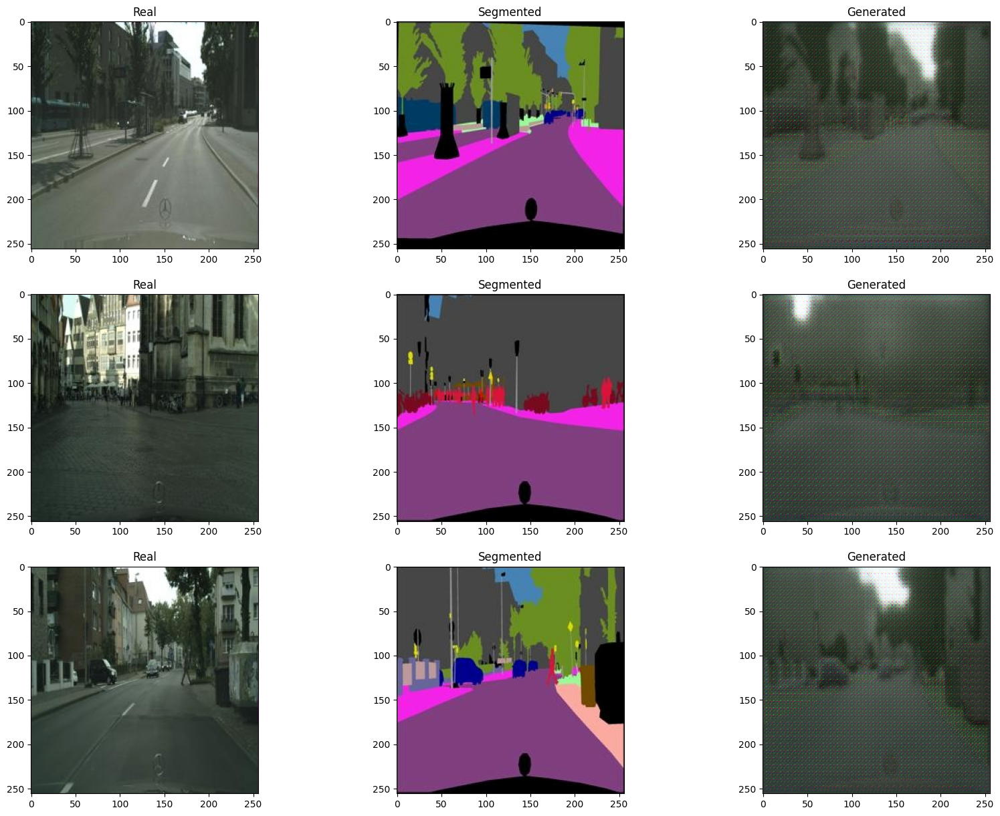

Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 10.99it/s, disc_loss=0.0003, gen_loss=2.0329, dsic_lr=9.8e-05, gen_lr=9.8e-05]


epoch : 1/50
 train disc loss : 0.004341892517480447, train gen loss : 1.7204559447384682


validation : 100%|██████████| 500/500 [00:18<00:00, 27.58it/s, disc_loss=2.5524, gen_loss=1.7001]


val disc loss : 2.9470406937599183, val gen loss : 1.833092699766159


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 11.00it/s, disc_loss=0.0001, gen_loss=1.6225, dsic_lr=9.8e-05, gen_lr=9.8e-05]


epoch : 2/50
 train disc loss : 0.0028631264616638917, train gen loss : 1.747095286044754


validation : 100%|██████████| 500/500 [00:18<00:00, 27.59it/s, disc_loss=2.7403, gen_loss=1.6253]


val disc loss : 2.764831755638123, val gen loss : 1.739292435646057


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 11.00it/s, disc_loss=0.0000, gen_loss=1.0566, dsic_lr=9.8e-05, gen_lr=9.8e-05]


epoch : 3/50
 train disc loss : 4.41474015359508e-05, train gen loss : 1.653289269479383


validation : 100%|██████████| 500/500 [00:18<00:00, 27.60it/s, disc_loss=3.0437, gen_loss=1.6036]


val disc loss : 2.9146581792831423, val gen loss : 1.749596599817276


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 10.98it/s, disc_loss=0.0000, gen_loss=1.3263, dsic_lr=9.8e-05, gen_lr=9.8e-05]


epoch : 4/50
 train disc loss : 6.264411376374299e-06, train gen loss : 1.606500693309207


validation : 100%|██████████| 500/500 [00:18<00:00, 27.59it/s, disc_loss=3.0189, gen_loss=1.5597]


val disc loss : 2.9309137272834778, val gen loss : 1.7464972277879716


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 10.99it/s, disc_loss=0.0001, gen_loss=1.4385, dsic_lr=9.8e-05, gen_lr=9.8e-05]


epoch : 5/50
 train disc loss : 0.015612332301444829, train gen loss : 1.7043771573074726


validation : 100%|██████████| 500/500 [00:18<00:00, 27.56it/s, disc_loss=2.8407, gen_loss=1.5765]


val disc loss : 2.9523769335746763, val gen loss : 1.7322552816867829


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 10.99it/s, disc_loss=0.0000, gen_loss=2.1107, dsic_lr=9.8e-05, gen_lr=9.8e-05]


epoch : 6/50
 train disc loss : 9.4901748255806e-05, train gen loss : 1.603779187022137


validation : 100%|██████████| 500/500 [00:18<00:00, 27.55it/s, disc_loss=2.2561, gen_loss=1.5577]


val disc loss : 2.38792262840271, val gen loss : 1.7425987434387207


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 11.00it/s, disc_loss=0.0000, gen_loss=1.2855, dsic_lr=9.8e-05, gen_lr=9.8e-05]


epoch : 7/50
 train disc loss : 2.903125072361563e-05, train gen loss : 1.665060791708842


validation : 100%|██████████| 500/500 [00:18<00:00, 27.54it/s, disc_loss=2.9025, gen_loss=1.7895]


val disc loss : 2.8715584831237795, val gen loss : 1.888554927587509


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 10.99it/s, disc_loss=0.0000, gen_loss=1.7255, dsic_lr=9.8e-05, gen_lr=9.8e-05]


epoch : 8/50
 train disc loss : 3.892026753312487e-06, train gen loss : 1.6585791981320421


validation : 100%|██████████| 500/500 [00:18<00:00, 27.58it/s, disc_loss=3.2366, gen_loss=1.6445]


val disc loss : 3.181862506389618, val gen loss : 1.78319564306736


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 10.99it/s, disc_loss=0.0002, gen_loss=1.4506, dsic_lr=9.8e-05, gen_lr=9.8e-05]


epoch : 9/50
 train disc loss : 0.002585258929789033, train gen loss : 1.6783573812396586


validation : 100%|██████████| 500/500 [00:18<00:00, 27.63it/s, disc_loss=2.3393, gen_loss=1.6451]


val disc loss : 2.186981172800064, val gen loss : 1.8439692234992981


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 10.99it/s, disc_loss=0.0000, gen_loss=1.6713, dsic_lr=9.8e-05, gen_lr=9.8e-05]


epoch : 10/50
 train disc loss : 0.002216591627516553, train gen loss : 1.5063317889325758


validation : 100%|██████████| 500/500 [00:18<00:00, 27.68it/s, disc_loss=2.8220, gen_loss=1.5418]


val disc loss : 2.70908042883873, val gen loss : 1.731309236049652


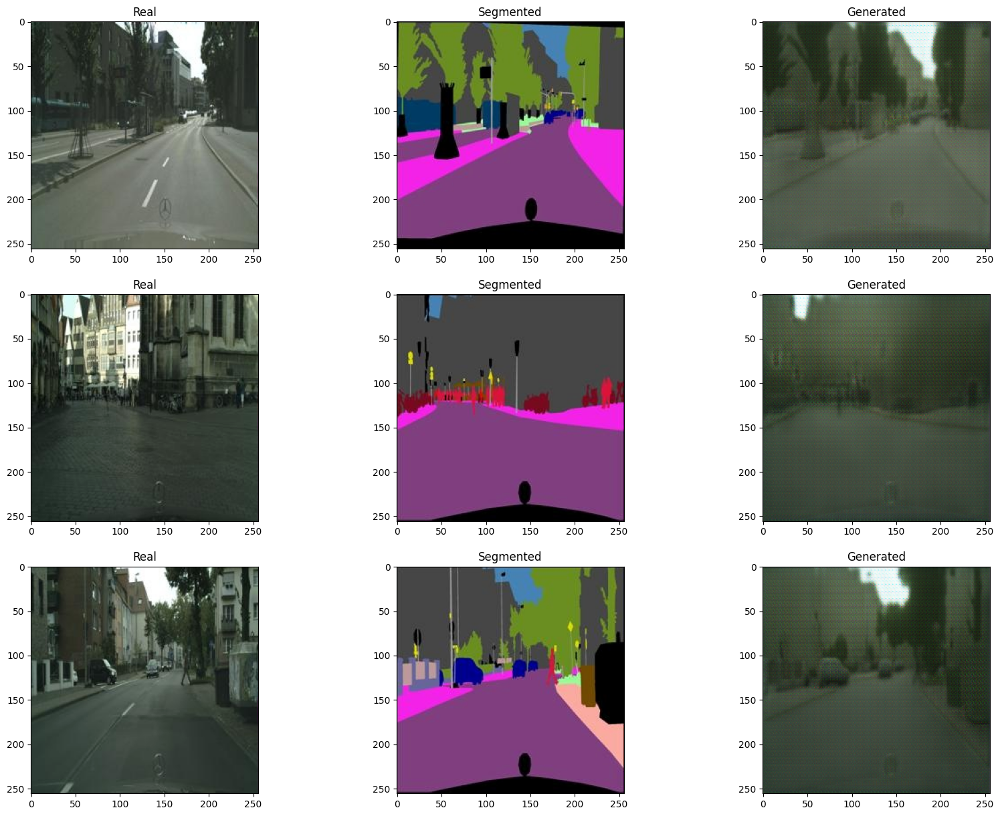

Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 10.99it/s, disc_loss=0.0001, gen_loss=1.3504, dsic_lr=9.6e-05, gen_lr=9.6e-05]


epoch : 11/50
 train disc loss : 0.00804464995323244, train gen loss : 1.532910465753379


validation : 100%|██████████| 500/500 [00:18<00:00, 27.66it/s, disc_loss=1.9313, gen_loss=1.6628]


val disc loss : 1.9959812235832215, val gen loss : 1.7639747122526168


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 10.99it/s, disc_loss=0.0000, gen_loss=3.7145, dsic_lr=9.6e-05, gen_lr=9.6e-05]


epoch : 12/50
 train disc loss : 3.555908174325659e-05, train gen loss : 1.4510724480011883


validation : 100%|██████████| 500/500 [00:18<00:00, 27.65it/s, disc_loss=1.8872, gen_loss=1.6266]


val disc loss : 1.9149969244003295, val gen loss : 1.7614143711328507


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 11.00it/s, disc_loss=0.0000, gen_loss=2.1859, dsic_lr=9.6e-05, gen_lr=9.6e-05]


epoch : 13/50
 train disc loss : 1.9956642917342465e-05, train gen loss : 1.5928879495829094


validation : 100%|██████████| 500/500 [00:18<00:00, 27.61it/s, disc_loss=2.2024, gen_loss=1.9887]


val disc loss : 2.2033334131240845, val gen loss : 2.0007896337509155


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 10.99it/s, disc_loss=0.0000, gen_loss=1.4711, dsic_lr=9.6e-05, gen_lr=9.6e-05]


epoch : 14/50
 train disc loss : 2.993125558952838e-06, train gen loss : 1.751382509520074


validation : 100%|██████████| 500/500 [00:18<00:00, 27.61it/s, disc_loss=2.3114, gen_loss=2.0811]


val disc loss : 2.2490069231986998, val gen loss : 2.0469474256038667


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 10.99it/s, disc_loss=0.0000, gen_loss=1.3728, dsic_lr=9.6e-05, gen_lr=9.6e-05]


epoch : 15/50
 train disc loss : 5.490200268905066e-07, train gen loss : 1.6598366031326166


validation : 100%|██████████| 500/500 [00:18<00:00, 27.61it/s, disc_loss=2.3125, gen_loss=1.9047]


val disc loss : 2.2980135114192963, val gen loss : 1.9419676530361176


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 11.00it/s, disc_loss=0.0000, gen_loss=1.7146, dsic_lr=9.6e-05, gen_lr=9.6e-05]


epoch : 16/50
 train disc loss : 1.4378502370959724e-07, train gen loss : 1.6831346466561325


validation : 100%|██████████| 500/500 [00:18<00:00, 27.58it/s, disc_loss=2.4466, gen_loss=2.0414]


val disc loss : 2.421048572540283, val gen loss : 2.11414972782135


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 11.00it/s, disc_loss=0.0000, gen_loss=1.4862, dsic_lr=9.6e-05, gen_lr=9.6e-05]


epoch : 17/50
 train disc loss : 3.401398297108162e-08, train gen loss : 1.6556171442480647


validation : 100%|██████████| 500/500 [00:18<00:00, 27.61it/s, disc_loss=2.9400, gen_loss=1.9524]


val disc loss : 2.901095232963562, val gen loss : 2.0291159720420837


Training epoch: 100%|██████████| 2975/2975 [04:30<00:00, 11.00it/s, disc_loss=0.0000, gen_loss=1.5673, dsic_lr=9.6e-05, gen_lr=9.6e-05]


epoch : 18/50
 train disc loss : 9.084070256276993e-09, train gen loss : 1.575100139409554


validation : 100%|██████████| 500/500 [00:18<00:00, 27.59it/s, disc_loss=3.3212, gen_loss=1.8387]


val disc loss : 3.1678757667541504, val gen loss : 1.9918221831321716


Training epoch: 100%|██████████| 2975/2975 [04:29<00:00, 11.04it/s, disc_loss=0.0000, gen_loss=1.7061, dsic_lr=9.6e-05, gen_lr=9.6e-05]


epoch : 19/50
 train disc loss : 4.751041000915399e-09, train gen loss : 1.5320515342319714


validation : 100%|██████████| 500/500 [00:18<00:00, 27.64it/s, disc_loss=3.3685, gen_loss=1.8113]


val disc loss : 3.248135898590088, val gen loss : 1.9646407954692842


Training epoch: 100%|██████████| 2975/2975 [04:28<00:00, 11.09it/s, disc_loss=0.0000, gen_loss=1.1650, dsic_lr=9.6e-05, gen_lr=9.6e-05]


epoch : 20/50
 train disc loss : 2.7470980396902342e-09, train gen loss : 1.5118445139772752


validation : 100%|██████████| 500/500 [00:18<00:00, 27.58it/s, disc_loss=3.2818, gen_loss=1.9745]


val disc loss : 3.183790722370148, val gen loss : 2.003210617542267


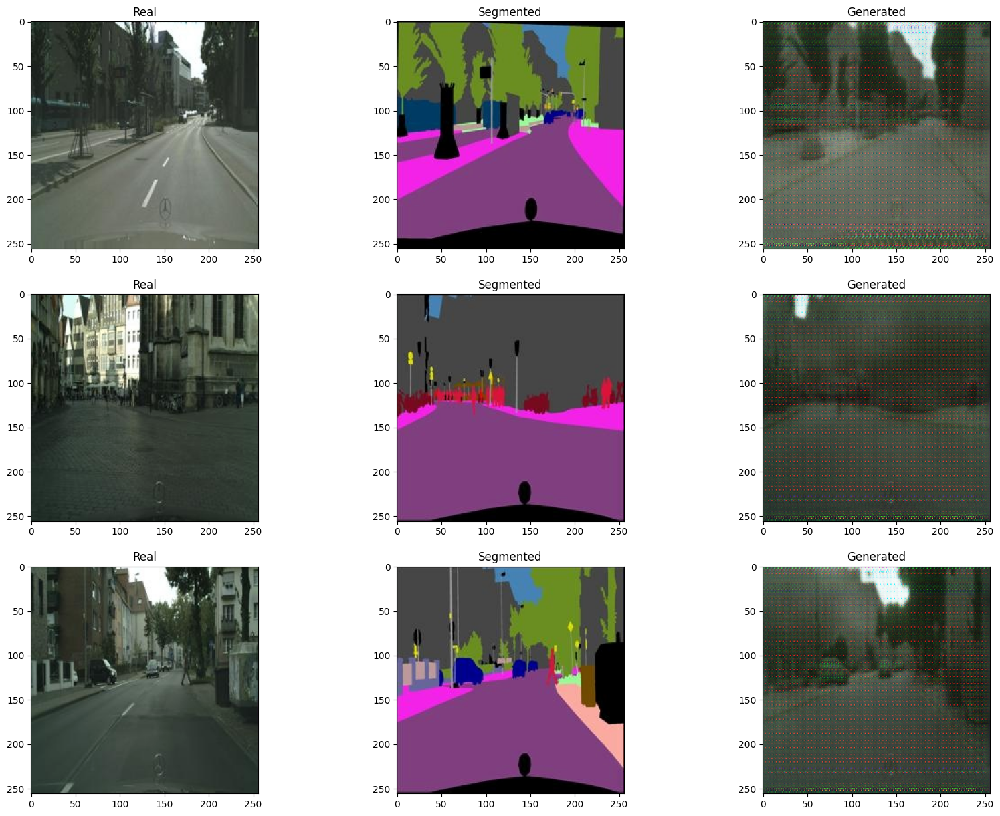

Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.11it/s, disc_loss=0.0000, gen_loss=1.3553, dsic_lr=9.41e-05, gen_lr=9.41e-05]


epoch : 21/50
 train disc loss : 2.031732288982864e-09, train gen loss : 1.4985623585075891


validation : 100%|██████████| 500/500 [00:18<00:00, 27.68it/s, disc_loss=3.3532, gen_loss=2.0055]


val disc loss : 3.3057670245170594, val gen loss : 2.004970711708069


Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.12it/s, disc_loss=0.0000, gen_loss=1.6684, dsic_lr=9.41e-05, gen_lr=9.41e-05]


epoch : 22/50
 train disc loss : 1.6373400759773605e-09, train gen loss : 1.4568092178897698


validation : 100%|██████████| 500/500 [00:18<00:00, 27.67it/s, disc_loss=3.4055, gen_loss=1.8877]


val disc loss : 3.2868193798065186, val gen loss : 1.964137859582901


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.15it/s, disc_loss=0.0000, gen_loss=1.0455, dsic_lr=9.41e-05, gen_lr=9.41e-05]


epoch : 23/50
 train disc loss : 1.4127559083372135e-09, train gen loss : 1.4367197557657707


validation : 100%|██████████| 500/500 [00:18<00:00, 27.68it/s, disc_loss=3.5601, gen_loss=1.8878]


val disc loss : 3.4481455459594725, val gen loss : 1.964185443162918


Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.14it/s, disc_loss=0.0000, gen_loss=1.5319, dsic_lr=9.41e-05, gen_lr=9.41e-05]


epoch : 24/50
 train disc loss : 1.324919498949463e-09, train gen loss : 1.4303667744868944


validation : 100%|██████████| 500/500 [00:18<00:00, 27.70it/s, disc_loss=3.7910, gen_loss=1.8073]


val disc loss : 3.644109454154968, val gen loss : 2.0088146178722384


Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.13it/s, disc_loss=0.0000, gen_loss=1.1516, dsic_lr=9.41e-05, gen_lr=9.41e-05]


epoch : 25/50
 train disc loss : 1.224493029959945e-09, train gen loss : 1.4209278661864144


validation : 100%|██████████| 500/500 [00:18<00:00, 27.67it/s, disc_loss=3.6566, gen_loss=1.8235]


val disc loss : 3.558191218852997, val gen loss : 1.9569008738994598


Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.13it/s, disc_loss=0.0000, gen_loss=1.0610, dsic_lr=9.41e-05, gen_lr=9.41e-05]


epoch : 26/50
 train disc loss : 1.1907434422509247e-09, train gen loss : 1.4130653493143932


validation : 100%|██████████| 500/500 [00:18<00:00, 27.66it/s, disc_loss=3.5975, gen_loss=1.9122]


val disc loss : 3.505379282474518, val gen loss : 1.961917857170105


Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.14it/s, disc_loss=0.0000, gen_loss=1.1296, dsic_lr=9.41e-05, gen_lr=9.41e-05]


epoch : 27/50
 train disc loss : 1.1382968219269489e-09, train gen loss : 1.4034551319154371


validation : 100%|██████████| 500/500 [00:18<00:00, 27.69it/s, disc_loss=3.4822, gen_loss=2.0075]


val disc loss : 3.4510716552734375, val gen loss : 1.9742247176170349


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.14it/s, disc_loss=0.0000, gen_loss=1.9768, dsic_lr=9.41e-05, gen_lr=9.41e-05]


epoch : 28/50
 train disc loss : 1.1090441518087977e-09, train gen loss : 1.394163130652003


validation : 100%|██████████| 500/500 [00:18<00:00, 27.67it/s, disc_loss=3.6479, gen_loss=1.8485]


val disc loss : 3.5288602986335755, val gen loss : 1.939135917186737


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.15it/s, disc_loss=0.0000, gen_loss=1.4754, dsic_lr=9.41e-05, gen_lr=9.41e-05]


epoch : 29/50
 train disc loss : 1.0706555668648732e-09, train gen loss : 1.386450632800575


validation : 100%|██████████| 500/500 [00:18<00:00, 27.71it/s, disc_loss=3.6764, gen_loss=1.8654]


val disc loss : 3.6341614871025087, val gen loss : 1.963588443517685


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.15it/s, disc_loss=0.0000, gen_loss=1.1698, dsic_lr=9.41e-05, gen_lr=9.41e-05]


epoch : 30/50
 train disc loss : 1.0599010776049545e-09, train gen loss : 1.3781804222820186


validation : 100%|██████████| 500/500 [00:18<00:00, 27.70it/s, disc_loss=3.4568, gen_loss=1.9454]


val disc loss : 3.379661143779755, val gen loss : 1.9988958132266998


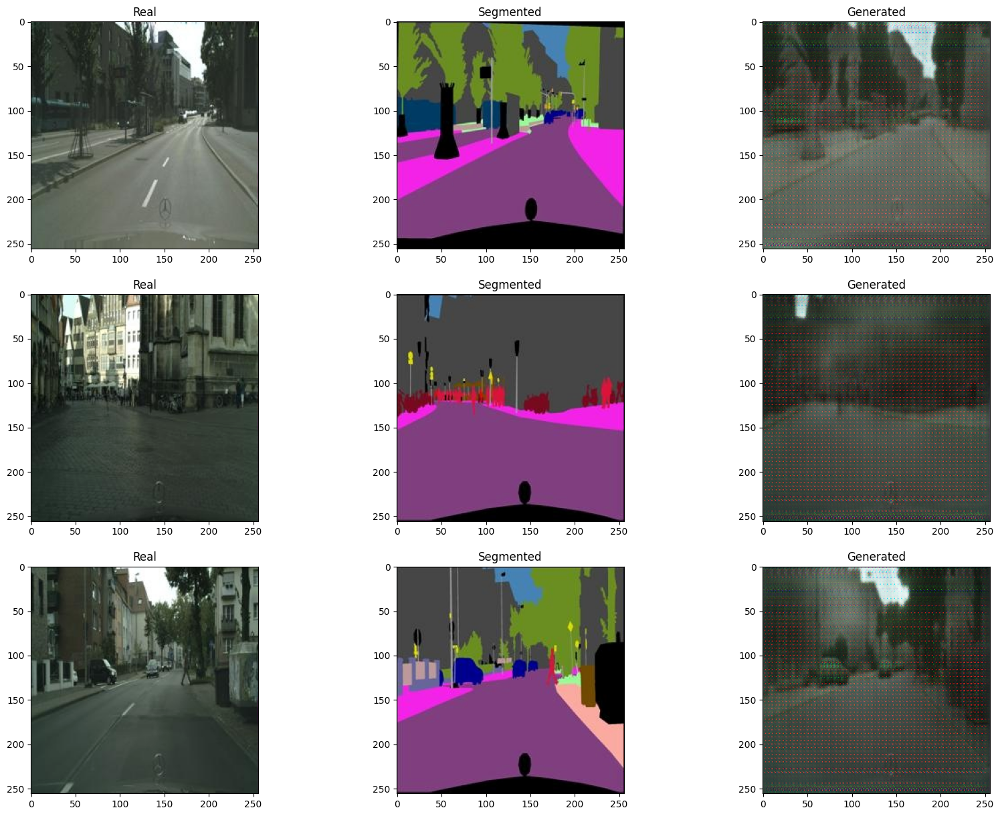

Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.15it/s, disc_loss=0.0000, gen_loss=1.2466, dsic_lr=9.22e-05, gen_lr=9.22e-05]


epoch : 31/50
 train disc loss : 1.0317874331766301e-09, train gen loss : 1.3711885065791987


validation : 100%|██████████| 500/500 [00:18<00:00, 27.68it/s, disc_loss=3.6079, gen_loss=2.0115]


val disc loss : 3.5778340644836426, val gen loss : 1.9950437214374541


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.15it/s, disc_loss=0.0000, gen_loss=1.2855, dsic_lr=9.22e-05, gen_lr=9.22e-05]


epoch : 32/50
 train disc loss : 1.0228251330402416e-09, train gen loss : 1.3632577892111128


validation : 100%|██████████| 500/500 [00:18<00:00, 27.73it/s, disc_loss=3.8223, gen_loss=1.9783]


val disc loss : 3.7547832317352294, val gen loss : 1.942537169456482


Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.14it/s, disc_loss=0.0000, gen_loss=1.1478, dsic_lr=9.22e-05, gen_lr=9.22e-05]


epoch : 33/50
 train disc loss : 1.0069808134770625e-09, train gen loss : 1.3549644204348075


validation : 100%|██████████| 500/500 [00:18<00:00, 27.68it/s, disc_loss=3.5414, gen_loss=1.9417]


val disc loss : 3.5510797576904296, val gen loss : 1.944756338596344


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.15it/s, disc_loss=0.0000, gen_loss=1.2063, dsic_lr=9.22e-05, gen_lr=9.22e-05]


epoch : 34/50
 train disc loss : 9.957377959703432e-10, train gen loss : 1.3446446288132867


validation : 100%|██████████| 500/500 [00:18<00:00, 27.67it/s, disc_loss=3.6680, gen_loss=1.8899]


val disc loss : 3.6275997405052185, val gen loss : 1.9727092399597168


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.14it/s, disc_loss=0.0000, gen_loss=1.1069, dsic_lr=9.22e-05, gen_lr=9.22e-05]


epoch : 35/50
 train disc loss : 9.89207894682121e-10, train gen loss : 1.3368935211165613


validation : 100%|██████████| 500/500 [00:18<00:00, 27.61it/s, disc_loss=3.5538, gen_loss=1.8539]


val disc loss : 3.486795141220093, val gen loss : 1.9840079979896545


Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.14it/s, disc_loss=0.0000, gen_loss=1.4977, dsic_lr=9.22e-05, gen_lr=9.22e-05]


epoch : 36/50
 train disc loss : 9.797879148905867e-10, train gen loss : 1.3277592626539598


validation : 100%|██████████| 500/500 [00:18<00:00, 27.60it/s, disc_loss=3.8027, gen_loss=1.9099]


val disc loss : 3.728841947078705, val gen loss : 1.9690478572845458


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.14it/s, disc_loss=0.0000, gen_loss=1.3799, dsic_lr=9.22e-05, gen_lr=9.22e-05]


epoch : 37/50
 train disc loss : 9.756981261774803e-10, train gen loss : 1.3203448811899714


validation : 100%|██████████| 500/500 [00:18<00:00, 27.69it/s, disc_loss=3.7635, gen_loss=1.9358]


val disc loss : 3.7267085180282593, val gen loss : 2.012694053888321


Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.14it/s, disc_loss=0.0000, gen_loss=1.2571, dsic_lr=9.22e-05, gen_lr=9.22e-05]


epoch : 38/50
 train disc loss : 9.669521954284847e-10, train gen loss : 1.3130040240488132


validation : 100%|██████████| 500/500 [00:18<00:00, 27.60it/s, disc_loss=3.6694, gen_loss=1.8329]


val disc loss : 3.62090868139267, val gen loss : 1.9723442103862763


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.15it/s, disc_loss=0.0000, gen_loss=1.3074, dsic_lr=9.22e-05, gen_lr=9.22e-05]


epoch : 39/50
 train disc loss : 9.663605696978192e-10, train gen loss : 1.3081571542114772


validation : 100%|██████████| 500/500 [00:18<00:00, 27.56it/s, disc_loss=3.7594, gen_loss=1.9666]


val disc loss : 3.7087954416275024, val gen loss : 1.9736470923423768


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.16it/s, disc_loss=0.0000, gen_loss=1.0436, dsic_lr=9.22e-05, gen_lr=9.22e-05]


epoch : 40/50
 train disc loss : 9.633556178455785e-10, train gen loss : 1.3023371435814546


validation : 100%|██████████| 500/500 [00:18<00:00, 27.66it/s, disc_loss=3.7641, gen_loss=1.8845]


val disc loss : 3.69343972158432, val gen loss : 2.0198326165676117


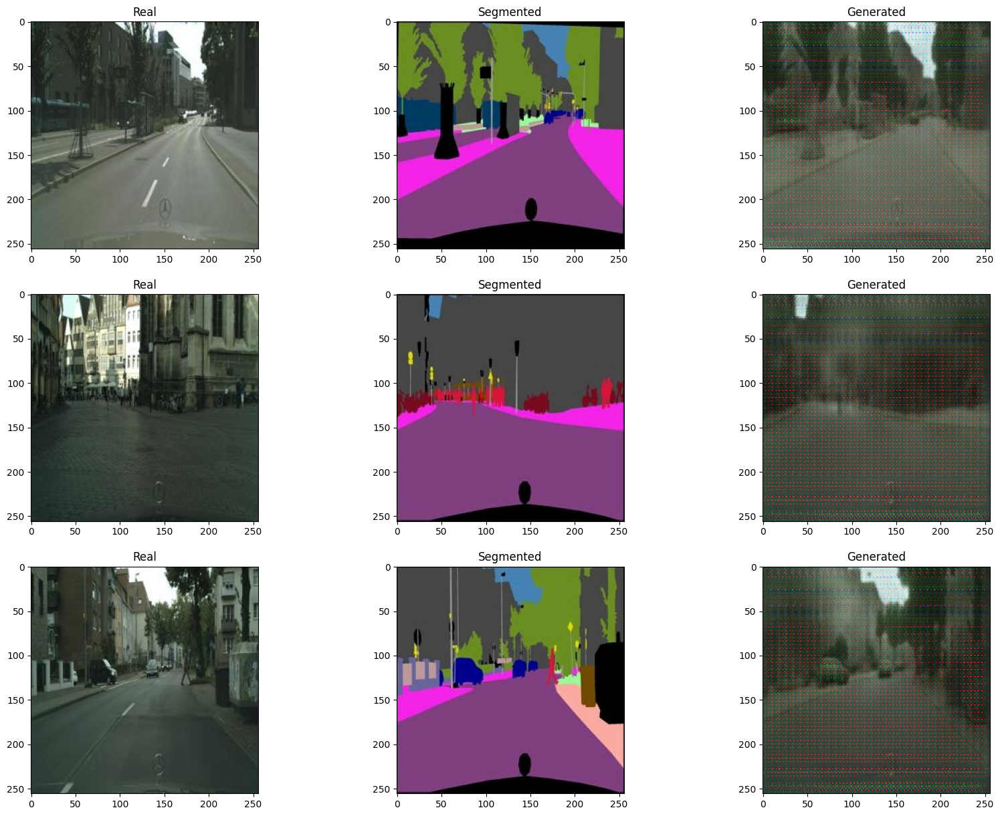

Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.15it/s, disc_loss=0.0000, gen_loss=1.0946, dsic_lr=9.04e-05, gen_lr=9.04e-05]


epoch : 41/50
 train disc loss : 9.625475248133132e-10, train gen loss : 1.2961059521226321


validation : 100%|██████████| 500/500 [00:18<00:00, 27.65it/s, disc_loss=3.5885, gen_loss=2.0724]


val disc loss : 3.5651400713920594, val gen loss : 2.0264742934703825


Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.13it/s, disc_loss=0.0000, gen_loss=1.1400, dsic_lr=9.04e-05, gen_lr=9.04e-05]


epoch : 42/50
 train disc loss : 9.474799500810539e-10, train gen loss : 1.2890855214175057


validation : 100%|██████████| 500/500 [00:18<00:00, 27.65it/s, disc_loss=3.9189, gen_loss=1.9266]


val disc loss : 3.831930567264557, val gen loss : 1.9838674941062928


Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.13it/s, disc_loss=0.0000, gen_loss=1.2768, dsic_lr=9.04e-05, gen_lr=9.04e-05]


epoch : 43/50
 train disc loss : 9.513296691213357e-10, train gen loss : 1.2848930375315561


validation : 100%|██████████| 500/500 [00:18<00:00, 27.61it/s, disc_loss=3.8735, gen_loss=1.8952]


val disc loss : 3.8140272154808046, val gen loss : 1.944191771030426


Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.14it/s, disc_loss=0.0000, gen_loss=1.0987, dsic_lr=9.04e-05, gen_lr=9.04e-05]


epoch : 44/50
 train disc loss : 9.467524492297098e-10, train gen loss : 1.2810430027256492


validation : 100%|██████████| 500/500 [00:18<00:00, 27.70it/s, disc_loss=3.7970, gen_loss=1.9208]


val disc loss : 3.7147045102119445, val gen loss : 2.0201553564071655


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.15it/s, disc_loss=0.0000, gen_loss=1.6958, dsic_lr=9.04e-05, gen_lr=9.04e-05]


epoch : 45/50
 train disc loss : 9.429415454149715e-10, train gen loss : 1.2762610201074296


validation : 100%|██████████| 500/500 [00:18<00:00, 27.57it/s, disc_loss=3.9105, gen_loss=1.9075]


val disc loss : 3.831805613517761, val gen loss : 1.957807053565979


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.16it/s, disc_loss=0.0000, gen_loss=1.2831, dsic_lr=9.04e-05, gen_lr=9.04e-05]


epoch : 46/50
 train disc loss : 9.364449452943619e-10, train gen loss : 1.2710447961142084


validation : 100%|██████████| 500/500 [00:18<00:00, 27.68it/s, disc_loss=3.8886, gen_loss=1.9262]


val disc loss : 3.780305350780487, val gen loss : 1.9571603832244873


Training epoch: 100%|██████████| 2975/2975 [04:27<00:00, 11.14it/s, disc_loss=0.0000, gen_loss=1.5348, dsic_lr=9.04e-05, gen_lr=9.04e-05]


epoch : 47/50
 train disc loss : 9.376496690101063e-10, train gen loss : 1.2672665073891647


validation : 100%|██████████| 500/500 [00:18<00:00, 27.67it/s, disc_loss=3.9925, gen_loss=1.8294]


val disc loss : 3.8598806805610657, val gen loss : 1.9397070696353913


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.17it/s, disc_loss=0.0000, gen_loss=1.3273, dsic_lr=9.04e-05, gen_lr=9.04e-05]


epoch : 48/50
 train disc loss : 9.341755645232906e-10, train gen loss : 1.2657710352865588


validation : 100%|██████████| 500/500 [00:18<00:00, 27.53it/s, disc_loss=3.9980, gen_loss=1.9117]


val disc loss : 3.8425865812301634, val gen loss : 1.985572637796402


Training epoch: 100%|██████████| 2975/2975 [04:26<00:00, 11.16it/s, disc_loss=0.0000, gen_loss=1.1185, dsic_lr=9.04e-05, gen_lr=9.04e-05]


epoch : 49/50
 train disc loss : 9.316159448175595e-10, train gen loss : 1.2610213005242228


validation : 100%|██████████| 500/500 [00:18<00:00, 27.63it/s, disc_loss=3.9492, gen_loss=1.9594]


val disc loss : 3.887481044769287, val gen loss : 2.0236742911338808


In [19]:
train_disc_losses, train_gen_losses = [], []
val_disc_losses, val_gen_losses = [], []

freq = 10

for epoch in range(num_epochs):
    train_disc_loss, train_gen_loss = train_one_epoch(disc, gen, train_loader, disc_optimizer, gen_optimizer)
    print(f"epoch : {epoch}/{num_epochs}\n train disc loss : {train_disc_loss}, train gen loss : {train_gen_loss}")
    val_disc_loss, val_gen_loss = evaluate(disc, gen, test_loader)
    print(f"val disc loss : {val_disc_loss}, val gen loss : {val_gen_loss}")

    train_disc_losses.append(train_disc_loss)
    train_gen_losses.append(train_gen_loss)
    val_disc_losses.append(val_disc_loss)
    val_gen_losses.append(val_gen_loss)

    torch.save(disc.state_dict(), f'disc{epoch}')
    torch.save(gen.state_dict(), f'gen{epoch}')
    
    
    if epoch % freq == 0:
        visualize(gen, test_loader)
        disc_scheduler.step()
        gen_scheduler.step()

### Plot Losses 
after training we plot he training and validation losses for discriminator and generator : 

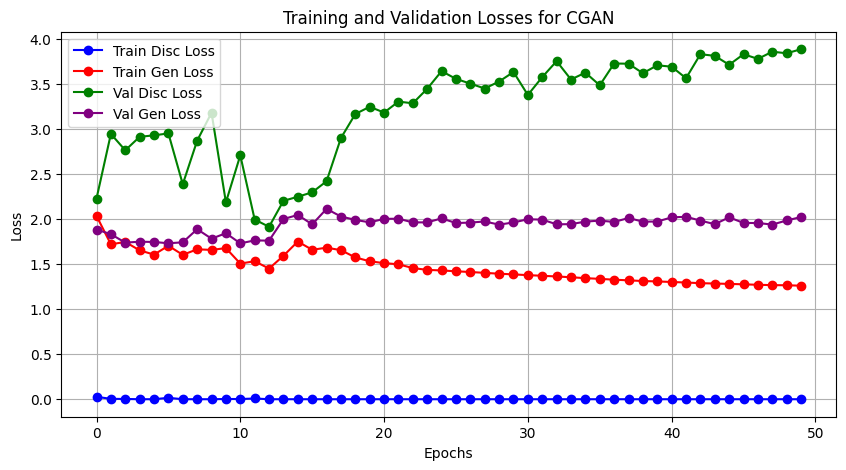

In [20]:
plt.figure(figsize=(10, 5))
plt.plot(train_disc_losses, label='Train Disc Loss', color='blue', marker='o')
plt.plot(train_gen_losses, label='Train Gen Loss', color='red', marker='o')
plt.plot(val_disc_losses, label='Val Disc Loss', color='green', marker='o')
plt.plot(val_gen_losses, label='Val Gen Loss', color='purple', marker='o')
plt.title('Training and Validation Losses for CGAN')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend() 
plt.grid(True)

plt.show()